## Classify and count sea lions from image

In [1]:
INPUT_DIR = '../../input/kaggle-sea-lion/'
OUTPUT_DIR = '../../output/kaggle-sea-lion/10/'

IMAGE_DIMS = (84,84,3)
LABEL_DIMS = (6,)
LOAD_WEIGHTS_FILE = INPUT_DIR + '05/weights-medium1-class0-84x84.h5'
LOAD_MODEL_FILE = None
DEBUG = False
IMAGE_SLICE = slice(1300,2800)

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import h5py
import matplotlib.pyplot as plt
import sklearn
import os
import glob
import cv2

from modules.logging import logger
import modules.utils as utils
from modules.utils import Timer
import modules.logging
import modules.cnn as cnn
import modules.lions as lions
import modules.objectdetect as objectdetect

Using TensorFlow backend.


### Prepare output dir

In [3]:
utils.mkdirs(OUTPUT_DIR, recreate=True)
modules.logging.setup_file_logger(OUTPUT_DIR + 'out.log')
logger.info('Dir ' + OUTPUT_DIR + ' created')

2017-06-08 18:09:19,798 INFO Dir ../../output/kaggle-sea-lion/10/ created


In [4]:
#from MismatchedTrainImages.txt
MISMATCHED = [3, 7, 9, 21, 30, 34, 71, 81, 89, 97, 151, 184, 215, 234, 242, 268, 290, 311, 331, 344, 380, 384, 406, 421, 469, 475, 490, 499, 507, 530, 531, 605, 607, 614, 621, 638, 644, 687, 712, 721, 767, 779, 781, 794, 800, 811, 839, 840, 869, 882, 901, 903, 905, 909, 913, 927, 946]


## Explore lion classification using CNN

### Load trained CNN model

In [5]:
logger.info('Load CNN model')

#lion simple cnn forward time: ~10ms
print(LOAD_WEIGHTS_FILE)
model = lions.convnet_medium1_lion_keras(IMAGE_DIMS)
model.load_weights(LOAD_WEIGHTS_FILE)

2017-06-08 18:09:19,841 INFO Load CNN model
/notebooks/datascience-snippets/kaggle-sea-lion/modules/lions.py:69: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), kernel_initializer="glorot_uniform", activation="relu", padding="same")`
  model.add(convolutional.Conv2D(64, (3, 3), activation='relu', padding='same', init='glorot_uniform'))
/notebooks/datascience-snippets/kaggle-sea-lion/modules/lions.py:71: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), kernel_initializer="glorot_uniform", activation="relu", padding="same")`
  model.add(convolutional.Conv2D(128, (3, 3), activation='relu', padding='same', init='glorot_uniform'))
/notebooks/datascience-snippets/kaggle-sea-lion/modules/lions.py:73: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 3), kernel_initializer="glorot_uniform", activation="relu", padding="same")`
  model.add(convolutional.Conv2D(256, (3, 3), activation='relu', padding='same', i

../../input/kaggle-sea-lion/05/weights-medium1-class0-84x84.h5


### Perform sliding window search

In [6]:
img_path = INPUT_DIR + 'Train/42.jpg'
img = cv2.imread(img_path)
img = img[IMAGE_SLICE]

imgd_path = INPUT_DIR + 'TrainDotted/42.jpg'
imgd = cv2.imread(imgd_path)
imgd = imgd[IMAGE_SLICE]

#img = img[1800:2500,3000:4000]
#img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY).astype('u1')

""" Returns (score, label) """
def eval_region(region_img):
    y_pred = model.predict(np.array([region_img]))
    ylp = utils.onehot_to_label(np.array(y_pred))
    return y_pred[0][ylp[0]], ylp[0]

img2 = img.copy()

region_generator = objectdetect.sliding_window_generator(img2, step=(19,19), window=IMAGE_DIMS, pyramid_firstscale=None, pyramid_scale=0.65, pyramid_max_layers=1)
detections, imgs = objectdetect.evaluate_regions(region_generator, eval_region, filter_score_min=0.97, 
                                                 filter_labels=(0,1,2,3,4), apply_non_max_suppression=True, 
                                                 supression_overlap_threshold=0.0, threads=None)

print('regions found:')
print(len(detections))

2017-06-08 18:09:21,480 INFO pyramid layer=0 image=(1500, 4992, 3) scale=1
2017-06-08 18:09:21,482 INFO > [started] sliding_window...


(1500, 4992, 3)
836/1500 [==============>...........] 55% 259s remaining=206s sliding window

2017-06-08 18:13:44,866 INFO > [started] non_max_suppression. boxes=1000064...
2017-06-08 18:13:47,715 INFO > [done]    non_max_suppression. boxes=1000064 (2849.149 ms)


1330/1500 [======================>...] 88% 415s remaining=53s sliding windoww

2017-06-08 18:16:19,610 INFO > [started] non_max_suppression. boxes=1000138...
2017-06-08 18:16:22,567 INFO > [done]    non_max_suppression. boxes=1000138 (2956.235 ms)


1482/1500 [=========================>] 98% 448s remaining=5s sliding windoww

2017-06-08 18:16:49,618 INFO > [done]    sliding_window (448135.794 ms)
2017-06-08 18:16:49,620 INFO > [started] non_max_suppression. boxes=350775...
2017-06-08 18:16:50,569 INFO > [done]    non_max_suppression. boxes=350775 (949.196 ms)


regions found:
20


### Show results

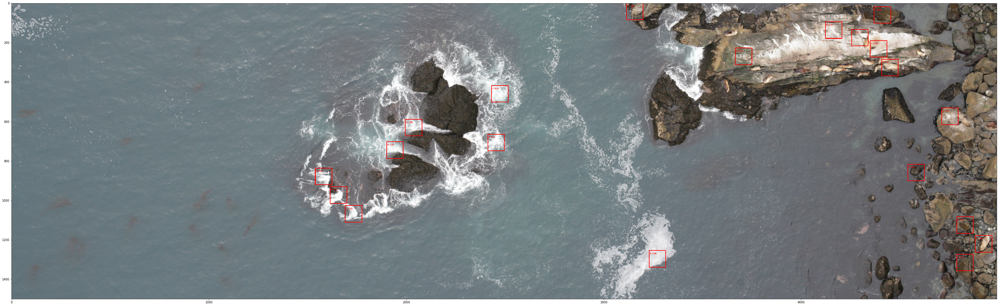

2017-06-08 18:16:55,019 INFO showing 20 images
2017-06-08 18:16:55,066 INFO > [started] generating image patches. rows=3; cols=10...


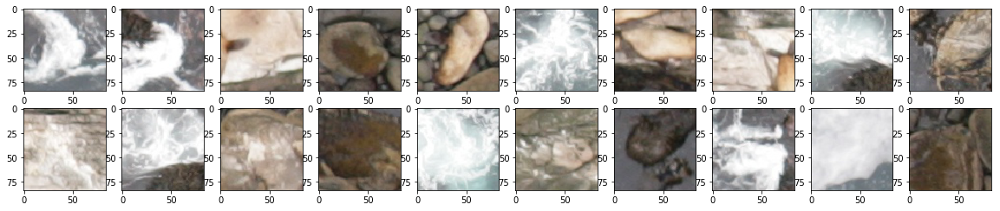

2017-06-08 18:16:56,740 INFO > [done]    generating image patches. rows=3; cols=10 (1673.762 ms)


In [7]:
def detection_to_colortext(detection):
    score = detection[4]
    text = str(int(detection[5])) + ' ' + '{0:.2f}'.format(score)
    c = int(score*255)
    return (0,0,c), text

objectdetect.draw_detections(detections, img2, detection_to_colortext)
utils.show_image(img2, size=60, is_bgr=True)

patches = objectdetect.extract_patches(detections, img)
utils.show_images(patches[0:50], size=2, cols=10, is_bgr=True)

### Verify classification/count performance

2017-06-08 18:16:56,821 INFO sea lions found: 18
2017-06-08 18:16:56,823 INFO sea lions added to dataset: 18
2017-06-08 18:16:56,824 INFO non sea lions added to dataset: 0


  ground positives: 18
detected positives: 20
   false positives: 18
    true positives: 2
  overall accuracy: 0.11


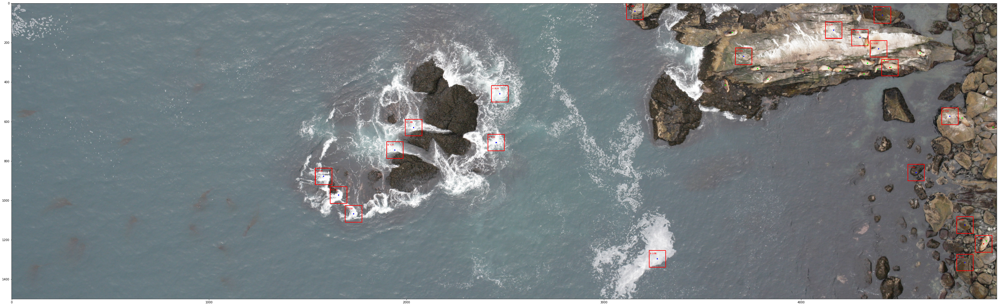

2017-06-08 18:17:01,418 INFO showing 18 images
2017-06-08 18:17:01,420 INFO > [started] generating image patches. rows=2; cols=10...


false positives (red is OK, blue are false positives)


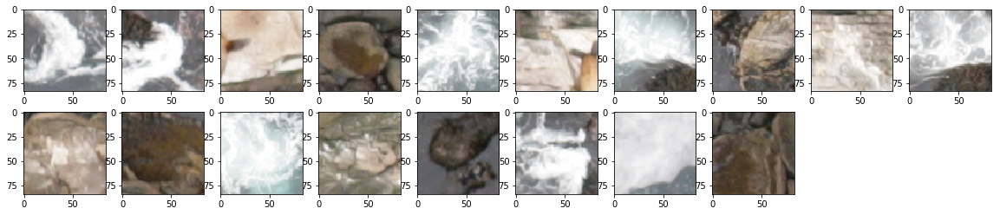

2017-06-08 18:17:02,963 INFO > [done]    generating image patches. rows=2; cols=10 (1542.925 ms)


In [8]:
classes_count_total,classes_count_added,lion_positions,lion_classes = lions.export_lions(img, imgd, None, None, IMAGE_DIMS, debug=False, min_distance_others=0, export_non_lion=False)
#print(lion_positions)

for i,lp in enumerate(lion_positions):
    cv2.circle(img2, lp, 3, (0,255,0), -5)

false_positives = []
true_positives = []
#print(lion_positions)
for i,detection in enumerate(detections):
    patch_pos = (int(detection[1]+detection[3]/2),int(detection[0]+detection[2]/2))
    is_far = utils.is_far_from_others(patch_pos, lion_positions, 30)
#    print(str(i) + ' ' + str(patch_pos) + ' ' + str(is_far))
    
    color = (0,0,255)
    if(is_far):
        color = (255,0,0)
        false_positives.append(detection)
    else:
        true_positives.append(detection)
    cv2.circle(img2, patch_pos, 3, color, -5)

fp = objectdetect.extract_patches(false_positives, img)

print('  ground positives: ' + str(len(lion_positions)))
print('detected positives: ' + str(len(detections)))
print('   false positives: ' + str(len(false_positives)))
print('    true positives: ' + str(len(true_positives)))
print('  overall accuracy: ' + '{0:.2f}'.format(len(true_positives)/len(lion_positions)))

utils.show_image(img2, is_bgr=True, size=60)
print('false positives (red is OK, blue are false positives)')
utils.show_images(fp, size=2, cols=10, is_bgr=True)

## Export false positive samples

### Prepare output dataset

In [9]:
x_ds = None
y_ds = None

logger.info('creating dataset')
dataset_path = OUTPUT_DIR + utils.dataset_name('lion-patches-false-positives', IMAGE_DIMS)
h5file = h5py.File(dataset_path, 'w')
x_ds, y_ds = utils.create_xy_dataset(h5file, IMAGE_DIMS, LABEL_DIMS, x_dtype='u1')
logger.info('done')

2017-06-08 18:17:02,976 INFO creating dataset
2017-06-08 18:17:02,983 INFO done


### Find and export all false positives

In [10]:
#from MismatchedTrainImages.txt
MISMATCHED = [3, 7, 9, 21, 30, 34, 71, 81, 89, 97, 151, 184, 215, 234, 242, 268, 290, 311, 331, 344, 380, 384, 406, 421, 469, 475, 490, 499, 507, 530, 531, 605, 607, 614, 621, 638, 644, 687, 712, 721, 767, 779, 781, 794, 800, 811, 839, 840, 869, 882, 901, 903, 905, 909, 913, 927, 946]
logger.info('loading train.csv')
train = pd.read_csv(INPUT_DIR + "Train/train.csv")
FORCE_IMAGES = [42]

2017-06-08 18:17:03,007 INFO loading train.csv


In [11]:
logger.info('process all photos from train file')

""" Returns (score, label) """
def eval_region(region_img):
    y_pred = model.predict(np.array([region_img]))
    ylp = utils.onehot_to_label(np.array(y_pred))
    return y_pred[0][ylp[0]], ylp[0]

total_lions = np.zeros(LABEL_DIMS[0]-1)
total_false_positives = np.zeros(LABEL_DIMS[0]-1)
total_true_positives = np.zeros(LABEL_DIMS[0]-1)
for row in train.itertuples():
    #load images
    train_id = row[1]
    
    if(FORCE_IMAGES!=None and train_id not in FORCE_IMAGES):
        continue
    
    image_raw_file = INPUT_DIR + 'Train/'+ str(train_id) +'.jpg'
    image_dotted_file = INPUT_DIR + 'TrainDotted/'+ str(train_id) +'.jpg'

    if(train_id in MISMATCHED):
        logger.warning('skipping mismatched train_id ' + str(train_id))
        continue
    
    if(not os.path.isfile(image_raw_file)):
        logger.warning('file not found. skipping. file=' + image_raw_file)
        continue

    t = Timer('processing photo ' + image_raw_file)
    image_raw = cv2.imread(image_raw_file)
    image_raw = image_raw[IMAGE_SLICE]
    image_dotted = cv2.imread(image_dotted_file)
    image_dotted = image_dotted[IMAGE_SLICE]

    #extract ground truth
    classes_count_total,classes_count_added,lion_positions,lion_classes = lions.export_lions(image_raw, image_dotted, None, None, IMAGE_DIMS, debug=DEBUG, min_distance_others=0, export_non_lion=False)
    for lc in lion_classes:
        total_lions[lc] += 1
    
    #search for lions
    region_generator = objectdetect.sliding_window_generator(image_raw, step=(19,19), window=IMAGE_DIMS, pyramid_max_layers=1, pyramid_scale=0.75)
    detections, imgs = objectdetect.evaluate_regions(region_generator, eval_region, filter_score_min=0.97, 
                                                     filter_labels=(0,1,2,3,4), apply_non_max_suppression=True, 
                                                     supression_overlap_threshold=0.08, threads=None)
    #compare ground truth to found lions
    false_positives = np.zeros(LABEL_DIMS[0]-1)
    false_positive_patches = []
    true_positives = np.zeros(LABEL_DIMS[0]-1)
    for i,detection in enumerate(detections):
        patch_pos = (int(detection[1]+detection[3]/2),int(detection[0]+detection[2]/2))
        is_far = utils.is_far_from_others(patch_pos, lion_positions, 30)
        if(is_far):
            false_positives[int(detection[5])] += 1
            false_positive_patches.append(detection)
        else:
            true_positives[int(detection[5])] += 1

    total_false_positives = np.add(total_false_positives, false_positives)
    total_true_positives = np.add(total_true_positives, true_positives)

    print('  ground positives: ' + str(len(lion_positions)))
    print('detected positives: ' + str(len(detections)))
    print('   false positives: ' + str(int(np.sum(false_positives))))
    print('    true positives: ' + str(int(np.sum(true_positives))))
    print('  overall accuracy: ' + '{0:.2f}'.format(np.sum(true_positives)/len(lion_positions)))

    false_positives_imgs = objectdetect.extract_patches(false_positive_patches, image_raw)
    
    for falseX in false_positives_imgs:
        utils.add_sample_to_dataset(x_ds, y_ds, falseX, utils.label_to_onehot([5], 6)[0])
    
    print('false positives patches')
    utils.show_images(false_positives_imgs[0:50], is_bgr=True, size=2)
    
    t.stop()
    
logger.info('GROUND TRUTH LIONS PER CLASS')
logger.info(str(total_lions))
logger.info('FALSE POSITIVES PER CLASS')
logger.info(str(total_false_positives))
logger.info('TRUE POSITIVES PER CLASS')
logger.info(str(total_true_positives))

logger.info('OVERALL ACCURACY:')
logger.info('{0:.2f}'.format(np.sum(total_true_positives)/np.sum(total_lions)))
#logger.info('OVERALL ACCURACY PER CLASS:')
#logger.info('{0:.2f}'.format(total_true_positives/total_lions))

h5file.close()

2017-06-08 18:17:03,113 INFO process all photos from train file
2017-06-08 18:17:03,120 INFO > [started] processing photo ../../input/kaggle-sea-lion/Train/42.jpg...
2017-06-08 18:17:03,682 INFO sea lions found: 18
2017-06-08 18:17:03,685 INFO sea lions added to dataset: 18
2017-06-08 18:17:03,686 INFO non sea lions added to dataset: 0
2017-06-08 18:17:03,696 INFO pyramid layer=0 image=(1500, 4992, 3) scale=1
2017-06-08 18:17:03,699 INFO > [started] sliding_window...


(1500, 4992, 3)
152/1500 [===>......................] 10% 44s remaining=392s sliding window

KeyboardInterrupt: 